# Path integrals for quantum mechanics with MCMC libraries

## Python imports

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline


import numpy as np
from numpy.random import uniform, normal
from scipy import integrate

import matplotlib.pyplot as plt
import seaborn as sns; sns.set_style("darkgrid"); sns.set_context("talk")


from Potential import Potential, V_HO, V_aHO
from Lepage import PathIntegral, bootstrap, binning


In [2]:
# Modules needed for example: emcee is for MCMCsampling, corner for plotting
from scipy import stats
import emcee
import corner

## 1-d potentials

### Make some plots of harmonic oscillator

In [3]:
# Instantiate a harmonic oscillator potential 
mass = 1.  
k_osc = 1.  # oscillator constant 
hbar = 1. 

test_ho = V_HO(k_osc, hbar, mass)    # harmonic oscillator
test_aho = V_aHO(k_osc, hbar, mass)  # aharmonic oscillator

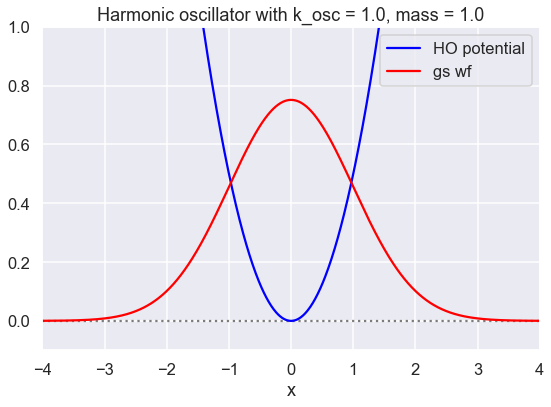

In [4]:
# Check the wave function and potential
x_pts_all = np.arange(-4., 4., .01)

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel(r'x')
#ax.set_ylabel(r'g(x)')
ax.set_xlim(-4., 4.)
ax.set_ylim(-0.1, 1.)
ax.axhline(0., color='black', alpha=0.5, linestyle='dotted')

test_ho.plot_V(ax, x_pts_all, V_label='HO potential')
ax.plot(x_pts_all, test_ho.wf_gs(x_pts_all), color='red', alpha=1, label='gs wf')

ax.set_title(f'{test_ho.V_string} with k_osc = {k_osc:.1f}, mass = {mass:.1f}')
ax.legend()
fig.tight_layout()

In [5]:
# Normalization check of wave function squared
integrate.simps(test_ho.wf_gs(x_pts_all)**2, x_pts_all)

0.9999999839221155

## Class for path integral

### Discretize time 

In [6]:
Delta_T = 0.25           # DeltaT --> "a" in Lepage
N_pts = 20              # N_pts --> "N" in Lepage 
Tmax = Delta_T * N_pts   # Tmax --> "T" in Lepage

### Set the number of configurations to generate (Nconfig) and the correlation time (Ncorr)

In [7]:
Delta_T = 0.25           # Delta_T --> "a" in Lepage
N_pts = 20               # N_pts --> "N" in Lepage 
Tmax = Delta_T * N_pts   # Tmax --> "T" in Lepage

N_config = 4000  # We'll want to try 25, 100, 1000, 10000 
N_corr = 20      # Lepage recommends 20 or so 
eps = 1.4        # suggested epsilon

new_PI = PathIntegral(Delta_T=Delta_T, N_pts=N_pts, N_config=N_config, 
                      N_corr=N_corr, eps=eps, V_pot=test_ho)



### Test of emcee

We'll take $\theta$ to be the values of $x$ at each of the `N_pts` time points. We'll choose the prior to be uniform in a reasonable range of $x$. Lepage suggests $-5 \leq x \leq +5$ is large enough to have negligible effect. Here `X` will be data.

In [10]:
x_min = -5.
x_max = +5.
min_theta = x_min * np.ones(N_pts)
max_theta = x_max * np.ones(N_pts)
volume_theta=np.prod(max_theta-min_theta)

def log_prior(theta):
    '''Log prior for parameter array theta'''
    assert len(theta)==N_pts, "Parameter vector must have length N_pts."
    # flat prior 
    if np.logical_and(min_theta<=theta, theta<=max_theta).all(): 
        return np.log(1/volume_theta)
    else:
        return -np.inf

def log_likelihood(theta, path_integral):
    '''Log likelihood for path integral given parameter array theta
        is given by minus the action for that path.
    '''
    try:
        return -path_integral.S_lattice(theta)
    except ValueError:
        return -np.inf

def log_posterior(theta, path_integral):
    '''Log posterior for path integral given parameter array theta'''
    return log_prior(theta) + log_likelihood(theta, path_integral)

In [11]:
path_integral = new_PI
N_corr = 20      # Lepage recommends 20 or so 

ndim = N_pts  # number of parameters in the model
nwalkers = 50  # number of MCMC walkers
nburn = 50 * N_corr  # "burn-in" period to let chains stabilize
nsteps = 20000  # number of MCMC steps to take

# we'll start at random locations within the prior volume
# we'll change this to normal distribution
# starting_guesses = min_theta + \
#                    (max_theta - min_theta) * np.random.rand(nwalkers,ndim)
starting_guesses = (x_max/10) * np.random.randn(nwalkers,ndim)

print(f"MCMC sampling using emcee (affine-invariant ensamble sampler) with {nwalkers} walkers")
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior, args=[path_integral])

# "burn-in" period; save final positions and then reset
pos, prob, state = sampler.run_mcmc(starting_guesses, nburn)
sampler.reset()

# sampling period
sampler.run_mcmc(pos, nsteps)

print("Mean acceptance fraction: {0:.3f} (in total {1} steps)"
                .format(np.mean(sampler.acceptance_fraction),nwalkers*nsteps))

# discard burn-in points and flatten the walkers; the shape of samples is (nwalkers*nsteps, ndim)
samples = sampler.chain.reshape((-1, ndim))

MCMC sampling using emcee (affine-invariant ensamble sampler) with 50 walkers
Mean acceptance fraction: 0.299 (in total 1000000 steps)


In [12]:
# tau = sampler.get_autocorr_time()
# print(tau)

In [13]:

print(samples.shape)
E_avg = new_PI.E_avg_over_paths(samples)
print(f'Average over {int(nwalkers*nsteps)} configurations is {E_avg:.5f}')


(1000000, 20)
Average over 1000000 configurations is 0.50066


In [14]:
samples_thinned = sampler.get_chain(discard=0, flat=True, thin=N_corr)

print(samples_thinned.shape)
E_avg = new_PI.E_avg_over_paths(samples_thinned)
print(f'Average over {int(nwalkers*nsteps/N_corr)} configurations is {E_avg:.5f}')


(50000, 20)
Average over 50000 configurations is 0.50095


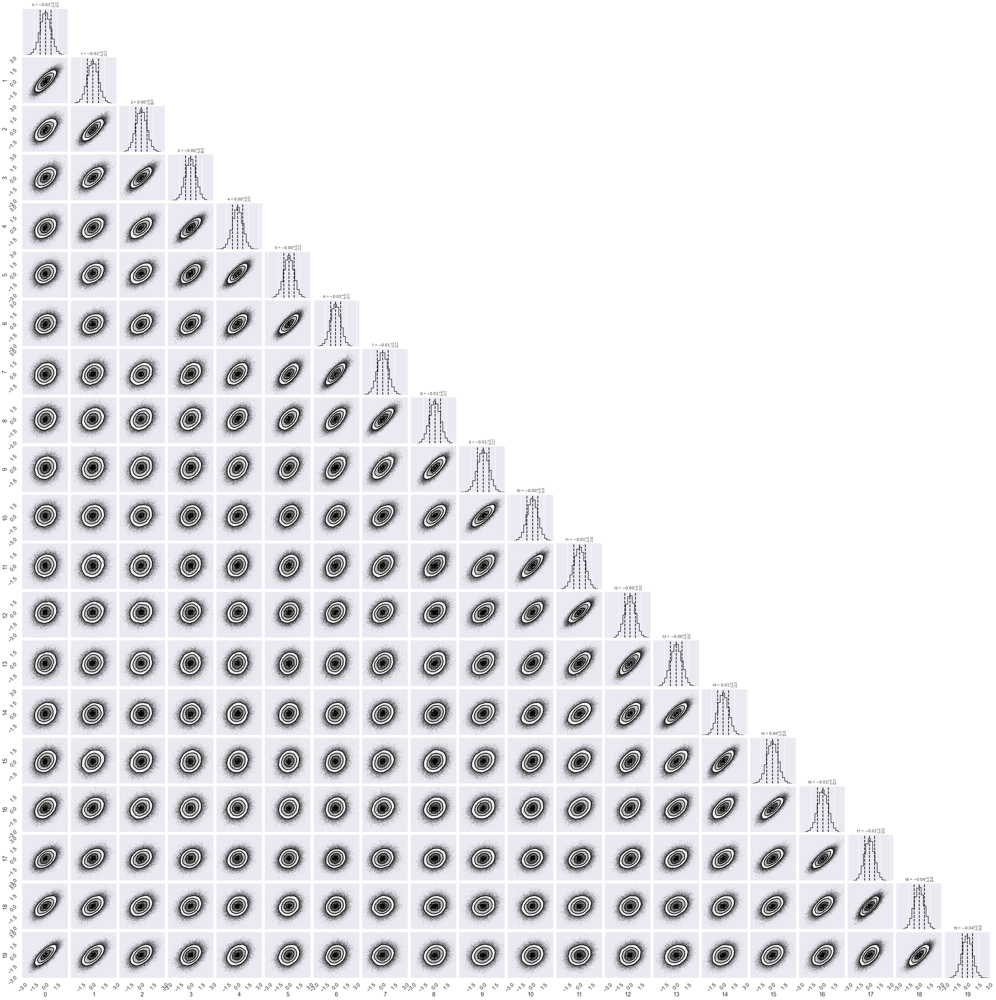

In [15]:
# make a corner plot with the posterior distribution
labels = [f"{str:.0f}" for str in range(N_pts)]

fig = corner.corner(samples_thinned, labels=labels,
                    quantiles=[0.16, 0.5, 0.84],
                    show_titles=True, title_kwargs={"fontsize": 12})


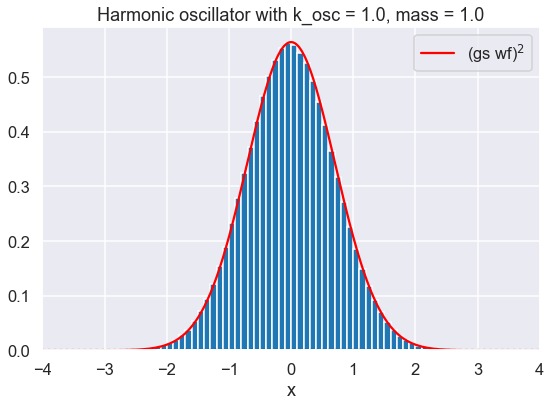

In [16]:
# Check the wave function and potential
x_pts_all = np.arange(-4., 4., .01)

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel(r'x')
#ax.set_ylabel(r'g(x)')
ax.set_xlim(-4., 4.)
#ax.set_ylim(-0.1, 1.)
ax.axhline(0., color='black', alpha=0.5, linestyle='dotted')

#test_ho.plot_V(ax, x_pts_all, V_label='HO potential')
ax.plot(x_pts_all, test_ho.wf_gs(x_pts_all)**2, color='red', alpha=1, label=fr'(gs wf)${{}}^2$')
#ax.hist(samples[:,3], bins=np.arange(x_min, x_max, .1), density=True)
ax.hist(samples.flatten(), bins=np.arange(x_min, x_max, .1), density=True)
#ax.hist(samples[:,1], bins=100, density=True)

ax.set_title(f'{test_ho.V_string} with k_osc = {k_osc:.1f}, mass = {mass:.1f}')
ax.legend()
fig.tight_layout()

### Try with zeus

In [17]:
import zeus

In [31]:
path_integral = new_PI
N_corr = 20      # Lepage recommends 20 or so 

ndim = N_pts  # number of parameters in the model
nwalkers = 50  # number of MCMC walkers
nburn = 10 * N_corr  # "burn-in" period to let chains stabilize
nsteps = 20000  # number of MCMC steps to take

# we'll start at random locations within the prior volume
# we'll change this to normal distribution
# starting_guesses = min_theta + \
#                    (max_theta - min_theta) * np.random.rand(nwalkers,ndim)
starting_guesses = (x_max/10) * np.random.randn(nwalkers,ndim)
#starting_guesses = (x_max/100) * np.random.randn(nwalkers,ndim)

# Do the burn-in with nburn steps
print(f"MCMC sampling using zeus (ensamble slice sampler) with {nwalkers} walkers")
sampler = zeus.EnsembleSampler(nwalkers, ndim, log_posterior, args=[path_integral])
sampler.run_mcmc(starting_guesses, nburn)

# Get the burn-in samples
burnin = sampler.get_chain()

# reset the start
starting_guesses = burnin[-1]

# now do the post-burn-in sampling with nsteps steps
sampler = zeus.EnsembleSampler(nwalkers, ndim, log_posterior, args=[path_integral])
sampler.run_mcmc(starting_guesses, nsteps)

Initialising ensemble of 50 walkers...


MCMC sampling using zeus (ensamble slice sampler) with 50 walkers


Sampling progress : 100%|████████████████████| 200/200 [00:01<00:00, 102.41it/s]
Initialising ensemble of 50 walkers...
Sampling progress : 100%|████████████████| 20000/20000 [03:14<00:00, 103.01it/s]


In [32]:
chain_thinned = sampler.get_chain(discard=0, flat=True, thin=N_corr)

print(chain_thinned.shape)
E_avg = new_PI.E_avg_over_paths(chain_thinned)
print(f'Average over {int(nwalkers*nsteps/N_corr)} configurations is {E_avg:.5f}')


(50000, 20)
Average over 50000 configurations is 0.50152


In [33]:
chain = sampler.get_chain(flat=True, discard=0, thin=1)
chain.shape

E_avg = new_PI.E_avg_over_paths(chain)
print(f'Average over {int(nwalkers*nsteps)} configurations is {E_avg:.5f}')


Average over 1000000 configurations is 0.50151


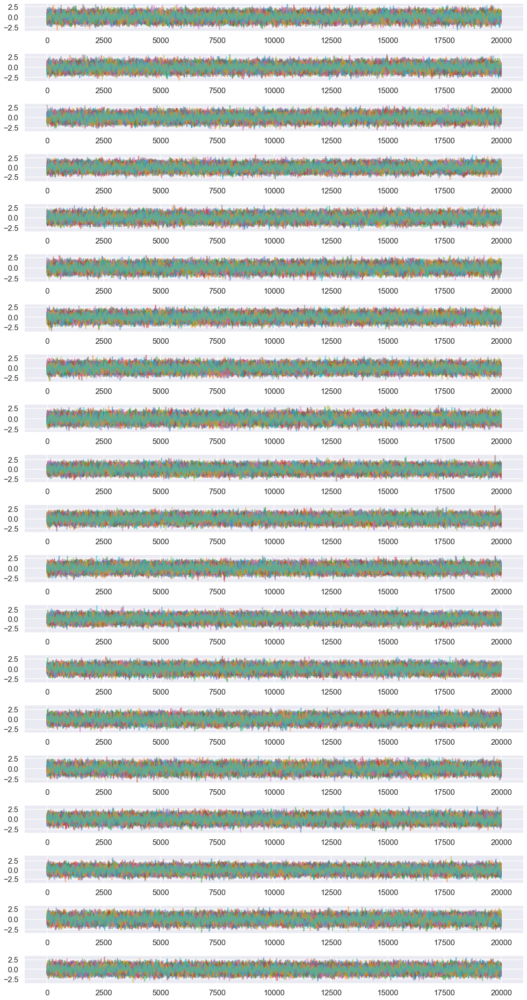

In [34]:
plt.figure(figsize=(16,1.5*ndim))
for n in range(ndim):
    plt.subplot2grid((ndim, 1), (n, 0))
    plt.plot(sampler.get_chain()[:,:,n],alpha=0.5)
    #plt.plot(chain[:,n],alpha=0.5)
    #plt.axhline(y=mu[n])
plt.tight_layout()
plt.show()

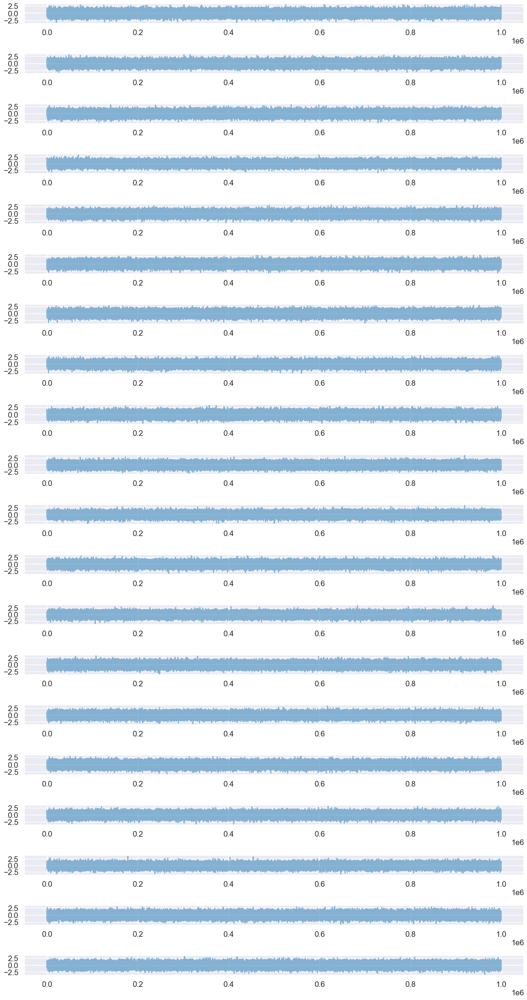

In [35]:
plt.figure(figsize=(16,1.5*ndim))
for n in range(ndim):
    plt.subplot2grid((ndim, 1), (n, 0))
    #plt.plot(sampler.get_chain()[:,:,n],alpha=0.5)
    plt.plot(chain[:,n],alpha=0.5)
    #plt.axhline(y=mu[n])
plt.tight_layout()
plt.show()

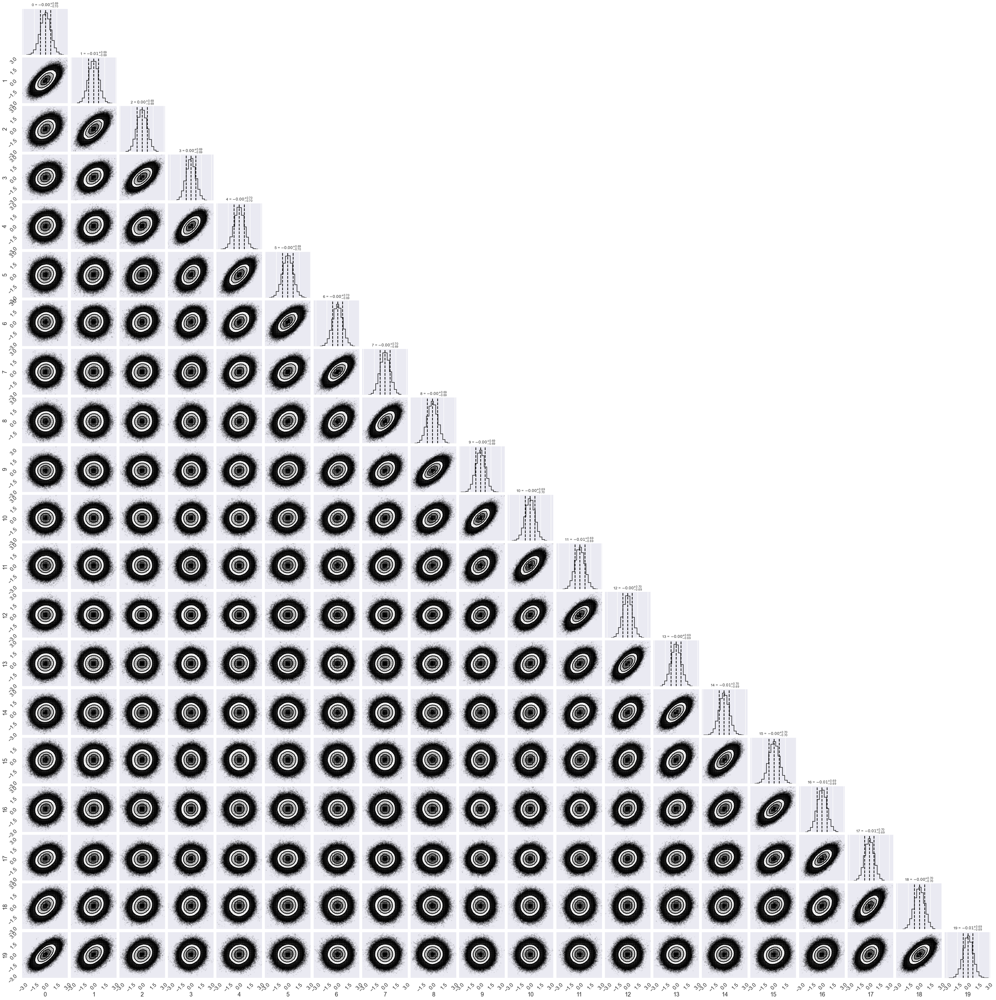

In [36]:
# make a corner plot with the posterior distribution
fig = corner.corner(chain, labels=labels,
                    quantiles=[0.16, 0.5, 0.84],
                    show_titles=True, title_kwargs={"fontsize": 12})



In [37]:
# # Try the zeus corner plot routine, using every 10
# fig, axes = zeus.cornerplot(chain[::10], size=(8,8))

### Trying a larger lattice spacing a

In [38]:
Delta_T = 0.50           # Delta_T --> "a" in Lepage
N_pts = 20               # N_pts --> "N" in Lepage 
Tmax = Delta_T * N_pts   # Tmax --> "T" in Lepage

N_config = 4000  # We'll want to try 25, 100, 1000, 10000 
N_corr = 20      # Lepage recommends 20 or so 
eps = 1.4        # suggested epsilon

new_PI = PathIntegral(Delta_T=Delta_T, N_pts=N_pts, N_config=N_config, 
                      N_corr=N_corr, eps=eps, V_pot=test_ho)


In [39]:
list_of_paths = new_PI.MC_paths()

print(list_of_paths.shape)
E_avg = new_PI.E_avg_over_paths(list_of_paths)
print(f'Average over {N_config} configurations is {E_avg:.5f}')


(4000, 20)
Average over 4000 configurations is 0.50425


In [40]:
E_avg_test = np.array([new_PI.Gamma_avg_over_paths(new_PI.H_lattice_j, n, list_of_paths) for n in range(N_pts)])
    
print(f'Average over {N_config} configurations at each n: ', E_avg_test)

print(f'\nMean: {np.mean(E_avg_test):.5f} +/- {np.std(E_avg_test)/np.sqrt(N_pts):.5f}')

Average over 4000 configurations at each n:  [0.50689785 0.50957981 0.51052945 0.49522871 0.50431029 0.49662248
 0.51056722 0.51422689 0.51409104 0.5106365  0.51980375 0.5015789
 0.50329373 0.48318467 0.49644936 0.50120671 0.49098146 0.51355307
 0.50716983 0.49500785]

Mean: 0.50425 +/- 0.00201


In [41]:
g_avg_test = np.array([new_PI.Gamma_avg_over_paths(new_PI.compute_G, n, list_of_paths) for n in range(N_pts)])

print(g_avg_test)

[0.4888312  0.29781211 0.18146419 0.10974756 0.06773585 0.04254266
 0.02680643 0.01745429 0.01342421 0.0098164  0.00828979 0.0098164
 0.01342421 0.01745429 0.02680643 0.04254266 0.06773585 0.10974756
 0.18146419 0.29781211]


In [42]:
DeltaE = np.array([np.log(g_avg_test[n] / g_avg_test[n+1]) / Delta_T for n in range(N_pts-1)])
print(DeltaE)

[ 0.99110889  0.99080896  1.00575093  0.96513449  0.93021672  0.92373095
  0.85811305  0.52505078  0.62601159  0.33805841 -0.33805841 -0.62601159
 -0.52505078 -0.85811305 -0.92373095 -0.93021672 -0.96513449 -1.00575093
 -0.99080896]


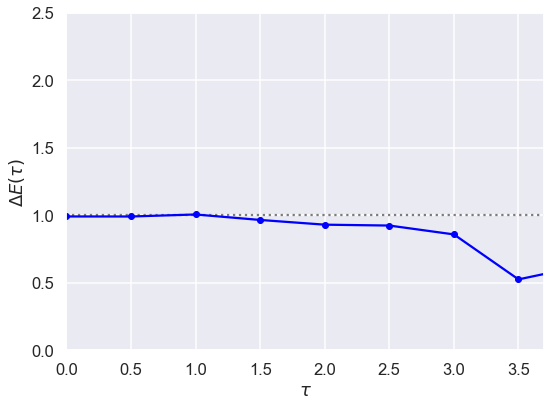

In [43]:
# Check the wave function and potential
t_pts_all = np.arange(0, (N_pts-1)*Delta_T, Delta_T)

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel(r'$\tau$')
ax.set_ylabel(r'$\Delta E(\tau)$')
ax.set_xlim(0,3.7)
ax.set_ylim(0, 2.5)
ax.axhline(1., color='black', alpha=0.5, linestyle='dotted')

ax.plot(t_pts_all, DeltaE, color='blue', alpha=1, marker='o', markersize=6)
#ax.legend()
fig.tight_layout()